# Capstone Modul 3 : Telco Customer Churn
Created by : Irfan Ardiana

---
# Business Problem Understanding

![Alt Text](https://images.unsplash.com/photo-1533664488202-6af66d26c44a?ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8MXx8dGVsZWNvbW11bmljYXRpb258ZW58MHx8MHx8fDA%3D&auto=format&fit=crop&w=800&q=60)


1. Latar Belakang:

Dalam industri telekomunikasi, fenomena churn pelanggan (churn rate) merupakan masalah yang umum terjadi. Churn pelanggan merujuk pada pelanggan yang memutuskan untuk berhenti menggunakan layanan sebuah perusahaan telekomunikasi dan beralih ke pesaing atau bahkan tidak menggunakan layanan telekomunikasi sama sekali. Tingkat churn yang tinggi dapat memiliki dampak negatif pada bisnis perusahaan, seperti pendapatan yang menurun, penurunan pangsa pasar, dan biaya akuisisi pelanggan yang meningkat. Dengan kondisi tersebut perusahaan ingin mengembangkan model prediksi churn customer untuk membantu mengidentifikasi customer yang berpotensi churn di masa depan. Dengan memiliki model prediksi yang akurat, perusahaan dapat mengambil tindakan pencegahan yang tepat untuk mempertahankan customer yang bernilai dan mengurangi tingkat churn dengan memahami faktor-faktor yang mempengaruhi churn dan mengembangkan strategi retensi yang efektif. Selain mempertahankan customer yang terprediksi akan churn juga diharapkan dari model dapat membedakan untuk target yang sebetulnya tidak perlu dilakukan penanganan karena aktualnya tidak ada indikasi untuk berhenti berlangganan sehingga meminimalkan juga biaya operasional yang keluar tanpa arti. Oleh karenanya akan dicari model dan metriks terbaik untuk mengatasi trade-off dari permaslahan yang terjadi.

2. Tujuan:

Tujuan utama dari analisis ini adalah untuk mengembangkan model prediksi churn customer yang dapat mengklasifikasikan customer sebagai churn atau tidak churn berdasarkan fitur-fitur yang ada. Model ini akan membantu perusahaan mengidentifikasi customer dengan risiko churn tinggi sehingga dapat dilakukan intervensi atau strategi retensi yang sesuai dan juga memaksimalkan prediksi yang tidak memiliki indikasi churn sehingga biaya operasional untuk penanganan dapat tersalurkan secara akurat untuk customer yang aktualnya memang churn.


3. Problem Statement:
- Bagaimana membangun model machine learning yang dapat mengklasifikasikan churn customer perusahaan telco sehingga bisa digunakan oleh perusahaan untuk mengoptimalkan strategi retensi dengan biaya operasional yang minimum?


4. Manfaat Bisnis:
- Dengan memiliki model prediksi churn yang akurat, perusahaan dapat mengidentifikasi customer dengan risiko churn tinggi dan mengambil tindakan pencegahan yang tepat untuk mempertahankan mereka.
- Mengurangi churn customer secara efektif dapat meningkatkan pendapatan perusahaan dan mengurangi biaya akuisisi customer baru. 
- Model prediksi churn yang baik juga dapat membantu perusahaan mengoptimalkan alokasi sumber daya dan strategi retensi, dengan fokus pada customer yang memiliki dampak bisnis yang signifikan.
- Melalui penggunaan model prediksi churn, perusahaan dapat mengembangkan strategi pemasaran yang lebih personal, meningkatkan kepuasan customer, dan memperkuat hubungan jangka panjang dengan customer.

5. Evaluation Metrics:

Metrics evaluasi yang digunakan pada pemodelan kali ini akan dilihat dari konteks kasus nya terlebih dahulu. Dalam kasus Telco Customer Churn, nilai 1 direpresentasikan untuk pelanggan yang churn dan nilai 0 direpresentasikan untuk customer yang tidak churn. Untuk false positive dan false negative yang ada pada kasus ini dapat dijelaskan sebagai berikut:

- False Positive:

    False positive terjadi ketika model memprediksi bahwa pelanggan churn (nilai prediksi 1), padahal sebenarnya pelanggan tersebut churn (nilai aktual 1). Dalam kasus ini, model secara keliru mengklasifikasikan pelanggan sebagai tidak churn ketika sebenarnya mereka akan berhenti berlangganan. Dampaknya adalah perusahaan mungkin mengalokasikan sumber daya yang tidak perlu untuk mempertahankan pelanggan yang sebenarnya akan churn, yang dapat mengakibatkan biaya yang tinggi.

- False Negative:

    False negative terjadi ketika model memprediksi bahwa pelanggan akan tidak churn (nilai prediksi 0), tetapi sebenarnya pelanggan tersebut tidak churn (nilai aktual 0). Dalam kasus ini, model gagal mengidentifikasi dengan tepat pelanggan yang sebenarnya tidak akan berhenti berlangganan. Dampaknya adalah, perusahaan dapat kehilangan pelanggan yang berharga karena tidak mengambil tindakan yang diperlukan untuk mempertahankan mereka, yang dapat mengakibatkan kerugian finansia.

Pada kasus ini, model diharapkan dapat memprediksi customer yang terindikasi churn dengan baik sehingga perlu diminimalkan untuk terjadi false negative dimana perusahaan akan abai membuat customer churn tanpa ada perlakuan retensi, untuk permasalahan ini metrics recall lebih sesuai sebagai acuan tolak ukur model. Disisi lain, perusahaan juga perlu memperhatikan dari sisi biaya dimana apabila false positive tinggi maka perusahaan berpotensi mengalokasikan biaya retensi kepada target yang salah sehingga memakan biaya tinggi yang tidak tepat sasaran. Untuk permasalahan tersebut, metrics F2 lebih sesuai untuk memprioritaskan recall namun tetap memperhatikan presisi model. Dari beberapa pertimbangan permasalahan yang telah dijelaskan, metrics F2 dan Recall akan dikaji dan dievaluasi mana yang dapat membuat objective tercapai namun lebih menguntukan bagi perusahaan.

---

In [38]:
# Library
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno
from IPython.display import display

# Sampling
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from sklearn.pipeline import make_pipeline

# Train Test Split
from sklearn.model_selection import train_test_split

# Menyatukan beberapa tahap Preprocessing atau fungsi lainnya
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Encoder dan Scaler
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import category_encoders as ce

# Cross Validation untuk menentukan Algoritma Terbaik
from sklearn.model_selection import cross_val_score, cross_val_predict, cross_validate, StratifiedKFold

# Metrics untuk Klasifikasi
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, make_scorer, fbeta_score, recall_score, precision_score, average_precision_score, precision_recall_curve, roc_auc_score, roc_curve, ConfusionMatrixDisplay
from sklearn.metrics import make_scorer, fbeta_score

# IMB Pipeline
from imblearn.pipeline import Pipeline

# Model Selection
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier


# Ignore Warning
import sys
import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")

# Set max columns
pd.set_option('display.max_columns', None)

---
# Data Understanding

Berikut adalah atribut-atribut yang ada dalam dataset Telco Customer Churn:

- Dependents: Menunjukkan apakah customer memiliki tanggungan atau tidak (Yes/No).
- Tenure: Menunjukkan jumlah bulan customer telah menggunakan layanan perusahaan.
- OnlineSecurity: Menunjukkan apakah customer memiliki layanan keamanan online atau tidak (Yes/No/No internet service).
- OnlineBackup: Menunjukkan apakah customer memiliki layanan backup online atau tidak (Yes/No/No internet service).
- InternetService: Menunjukkan jenis layanan internet yang dipesan oleh customer (DSL/Fiber optic/No).
- DeviceProtection: Menunjukkan apakah customer memiliki perlindungan perangkat atau tidak (Yes/No/No internet service).
- TechSupport: Menunjukkan apakah customer memiliki dukungan teknis atau tidak (Yes/No/No internet service).
- Contract: Menunjukkan jenis kontrak yang dimiliki customer (Month-to-month/One year/Two year).
- PaperlessBilling: Menunjukkan apakah customer menerima tagihan dalam bentuk elektronik atau kertas (Yes/No).
- MonthlyCharges: Menunjukkan jumlah biaya bulanan yang dikenakan kepada customer.
- Churn: Menunjukkan apakah customer churn atau tidak (Yes/No).
Atribut-atribut ini memberikan informasi tentang profil dan kebiasaan customer yang dapat digunakan untuk menganalisis faktor-faktor yang mempengaruhi churn dalam layanan telekomunikasi.

In [39]:
# Load Data
df = pd.read_csv('data_telco_customer_churn.csv')
df.head()

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges,Churn
0,Yes,9,No,No,DSL,Yes,Yes,Month-to-month,Yes,72.90,Yes
1,No,14,No,Yes,Fiber optic,Yes,No,Month-to-month,Yes,82.65,No
2,No,64,Yes,No,DSL,Yes,Yes,Two year,No,47.85,Yes
3,No,72,Yes,Yes,DSL,Yes,Yes,Two year,No,69.65,No
4,No,3,No internet service,No internet service,No,No internet service,No internet service,Month-to-month,Yes,23.60,No


In [40]:
# Count and Datatype for each Column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4930 entries, 0 to 4929
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Dependents        4930 non-null   object 
 1   tenure            4930 non-null   int64  
 2   OnlineSecurity    4930 non-null   object 
 3   OnlineBackup      4930 non-null   object 
 4   InternetService   4930 non-null   object 
 5   DeviceProtection  4930 non-null   object 
 6   TechSupport       4930 non-null   object 
 7   Contract          4930 non-null   object 
 8   PaperlessBilling  4930 non-null   object 
 9   MonthlyCharges    4930 non-null   float64
 10  Churn             4930 non-null   object 
dtypes: float64(1), int64(1), object(9)
memory usage: 423.8+ KB


---
# Data Cleaning

Pada bagian ini akan dilakukan pengecekan terkait apakah dataset memiliki duplikasi dan missing value agar datset siap untuk diproses dalam pembuatan model machine learning. Data cleaning, atau pembersihan data, diperlukan saat membuat model prediksi karena data yang kotor atau tidak terstruktur dapat mengganggu analisis dan menghasilkan model yang tidak akurat. Dengan melakukan pembersihan data yang baik, kita dapat memastikan bahwa data yang digunakan untuk melatih model prediksi adalah valid, konsisten, dan siap digunakan, sehingga meningkatkan kualitas model dan keakuratannya dalam memprediksi churn customer.

**Cek Missing Value & Data Unik:**

In [41]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(), round((df[col].isna().sum()/len(df[col])) * 100,2),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)])

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
dfDesc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,Dependents,object,0,0.0,2,"[Yes, No]"
1,tenure,int64,0,0.0,73,"[70, 44]"
2,OnlineSecurity,object,0,0.0,3,"[Yes, No internet service]"
3,OnlineBackup,object,0,0.0,3,"[Yes, No]"
4,InternetService,object,0,0.0,3,"[DSL, Fiber optic]"
5,DeviceProtection,object,0,0.0,3,"[No internet service, No]"
6,TechSupport,object,0,0.0,3,"[Yes, No]"
7,Contract,object,0,0.0,3,"[Two year, One year]"
8,PaperlessBilling,object,0,0.0,2,"[No, Yes]"
9,MonthlyCharges,float64,0,0.0,1422,"[67.5, 35.8]"


<Axes: >

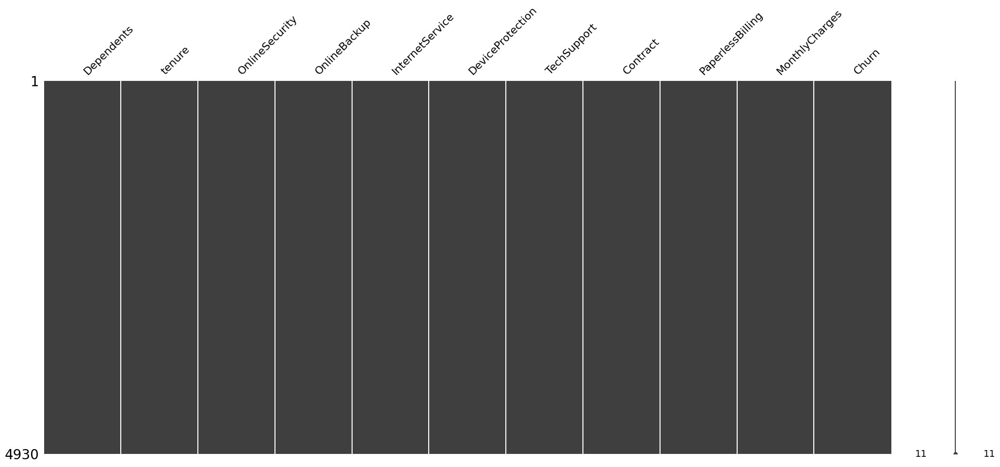

In [42]:
missingno.matrix(df)

Terlihat dari pengecekan diatas tidak didapatkan missing value pada masing-masing atribut.

In [43]:
cat_cols = ['Dependents','InternetService',
              'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
              'Contract', 'PaperlessBilling']

for i in cat_cols:
    print(f'Total unique values in {i}: ', df[i].nunique())
    print(f'Unique values: ', df[i].unique())
    print()


Total unique values in Dependents:  2
Unique values:  ['Yes' 'No']

Total unique values in InternetService:  3
Unique values:  ['DSL' 'Fiber optic' 'No']

Total unique values in OnlineSecurity:  3
Unique values:  ['No' 'Yes' 'No internet service']

Total unique values in OnlineBackup:  3
Unique values:  ['No' 'Yes' 'No internet service']

Total unique values in DeviceProtection:  3
Unique values:  ['Yes' 'No internet service' 'No']

Total unique values in TechSupport:  3
Unique values:  ['Yes' 'No' 'No internet service']

Total unique values in Contract:  3
Unique values:  ['Month-to-month' 'Two year' 'One year']

Total unique values in PaperlessBilling:  2
Unique values:  ['Yes' 'No']



Pada kolom `OnlineSecurity`, `OnlineBackup`, dan `DeviceProtection` memiliki value 'No' dan 'No internet service' yang memiliki nilai yang sama sehingga dalam konteks ini teks keduanya akan disamakan menjadi 'No'

In [44]:
df.replace(['No internet service'], 'No', inplace=True)

**Cek Duplikasi:**

In [45]:
df.duplicated().sum()

77

In [46]:
df[df.duplicated(keep=False)]

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges,Churn
87,No,1,No,No,No,No,No,Month-to-month,No,20.35,No
187,No,1,No,No,No,No,No,Month-to-month,No,19.65,No
204,No,18,No,No,No,No,No,One year,No,20.10,No
233,No,1,No,No,No,No,No,Month-to-month,No,19.90,No
264,No,1,No,No,Fiber optic,No,No,Month-to-month,Yes,74.45,Yes
...,...,...,...,...,...,...,...,...,...,...,...
4759,No,4,No,No,No,No,No,Month-to-month,No,20.05,No
4786,No,1,No,No,No,No,No,Month-to-month,No,20.35,No
4788,No,1,No,No,Fiber optic,No,No,Month-to-month,Yes,70.10,Yes
4866,No,1,No,No,DSL,No,No,Month-to-month,Yes,55.00,Yes


Terdapat duplikasi data pada dataset, namun setelah ditinjau data duplikat pada case ini memungkinkan terjadi dikarenakan setiap data adalah milik dari masing-masing unik customer yang bisa jadi memiliki value sama untuk satu sama lain, sehingga data duplikat ini akan dibiarkan dalam proses machine learning.

**Cek Outlier:**

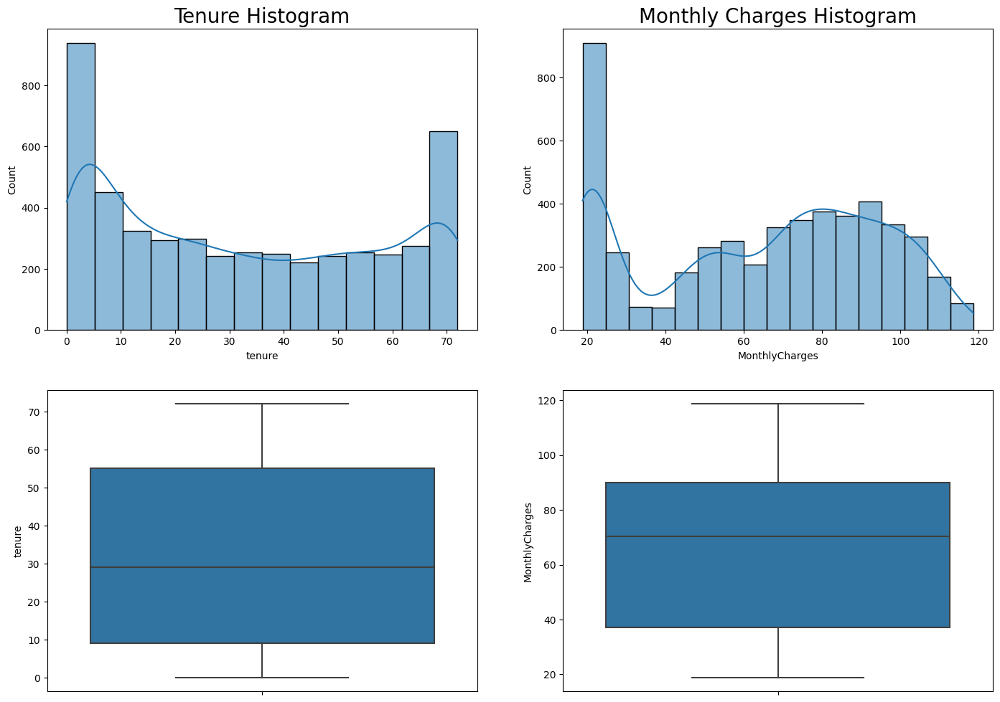

In [47]:
plt.figure(figsize=(17,12))

plt.subplot(221)
sns.histplot(data=df,x='tenure',kde=True)
plt.title('Tenure Histogram',fontsize=20)

plt.subplot(222)
sns.histplot(data=df,x='MonthlyCharges',kde=True)
plt.title('Monthly Charges Histogram',fontsize=20)

plt.subplot(223)
sns.boxplot(data=df,y='tenure')

plt.subplot(224)
sns.boxplot(data=df,y='MonthlyCharges')
plt.show()

Dari pengecekan histogram dan barplot pada atribut dengan tipe data numerik tidak tampak adanya outlier yang perlu ditangani lebih lanjut, sehingga dalam hal ini dataset akan dilanjut untuk proses pembuatan model sebagaimana adanya.

---
# Data Analysis

Data analisis membantu dalam pemahaman yang lebih baik tentang data yang digunakan dalam model prediksi. Ini melibatkan pemeriksaan statistik deskriptif, visualisasi, dan eksplorasi data untuk mengidentifikasi pola, tren, anomali, dan hubungan antara variabel sehigga dapat lebih dalam memahami konteks dari dataset yang akan dilakukan pemodelan.

**Distribusi kolom feature:**

In [48]:
for i in cat_cols:
    print(df[i].value_counts())
    print()

Dependents
No     3446
Yes    1484
Name: count, dtype: int64

InternetService
Fiber optic    2172
DSL            1706
No             1052
Name: count, dtype: int64

OnlineSecurity
No     3497
Yes    1433
Name: count, dtype: int64

OnlineBackup
No     3224
Yes    1706
Name: count, dtype: int64

DeviceProtection
No     3238
Yes    1692
Name: count, dtype: int64

TechSupport
No     3519
Yes    1411
Name: count, dtype: int64

Contract
Month-to-month    2721
Two year          1157
One year          1052
Name: count, dtype: int64

PaperlessBilling
Yes    2957
No     1973
Name: count, dtype: int64



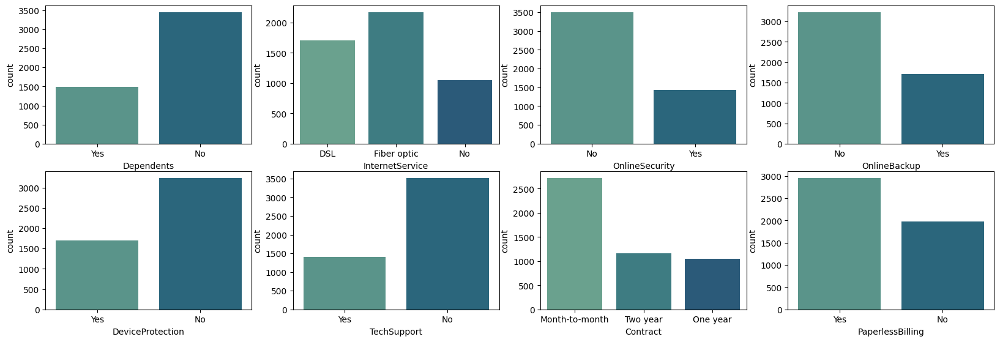

In [49]:
plt.figure(figsize=(20, 17))
for n, variable in enumerate(cat_cols):
    ax = plt.subplot(5, 4, n + 1)
    g=sns.countplot(data=df, x=df[variable], ax=ax, palette='crest')
plt.show() 


**Distribusi kolom feature berdasarkan value target:**

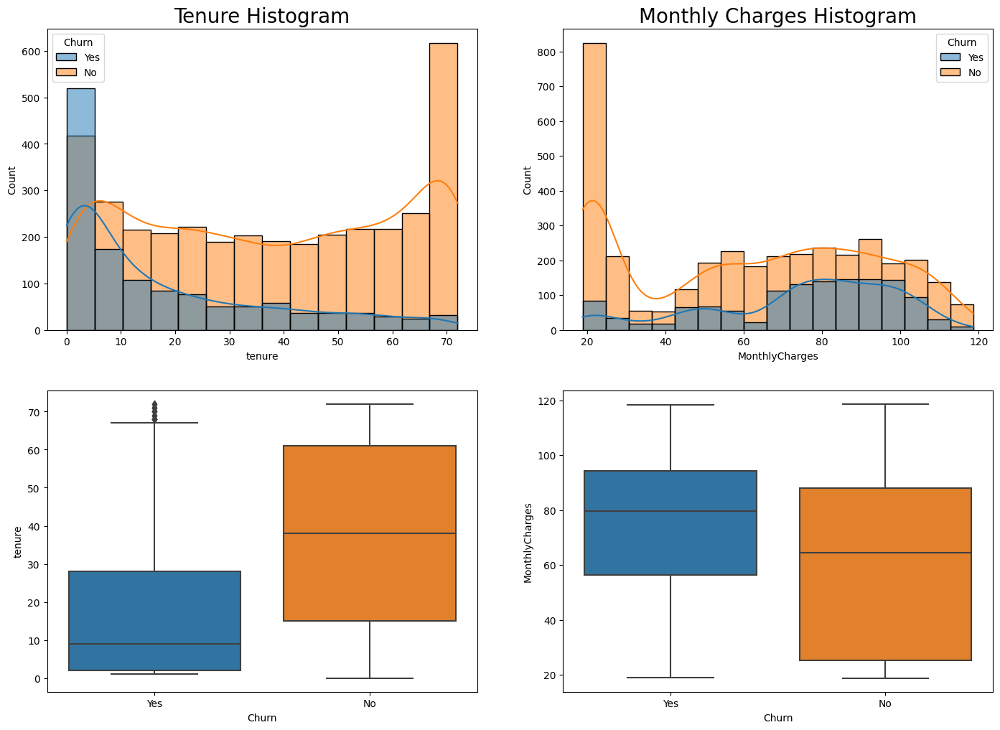

In [50]:
plt.figure(figsize=(17,12))

plt.subplot(221)
sns.histplot(data=df,x='tenure',hue='Churn',kde=True)
plt.title('Tenure Histogram',fontsize=20)

plt.subplot(222)
sns.histplot(data=df,x='MonthlyCharges',hue='Churn',kde=True)
plt.title('Monthly Charges Histogram',fontsize=20)

plt.subplot(223)
sns.boxplot(data=df,y='tenure', x='Churn')

plt.subplot(224)
sns.boxplot(data=df,y='MonthlyCharges', x='Churn')
plt.show()

Berdasarkan histogram dan boxplot diatas, dapat disimpulak bahwa terlihat perbedaan distribusi `tenure` dari target yang tidak churn dan target yang churn, dimana yang akan churn lebih rendah `tenure` dari yang tidak churn.

Sedangkan untuk distribusi `MonthlyCharges`, rerata dan median `MonthlyCharges` yang tinggi adalah yang churn dibanding yang tidak churn.

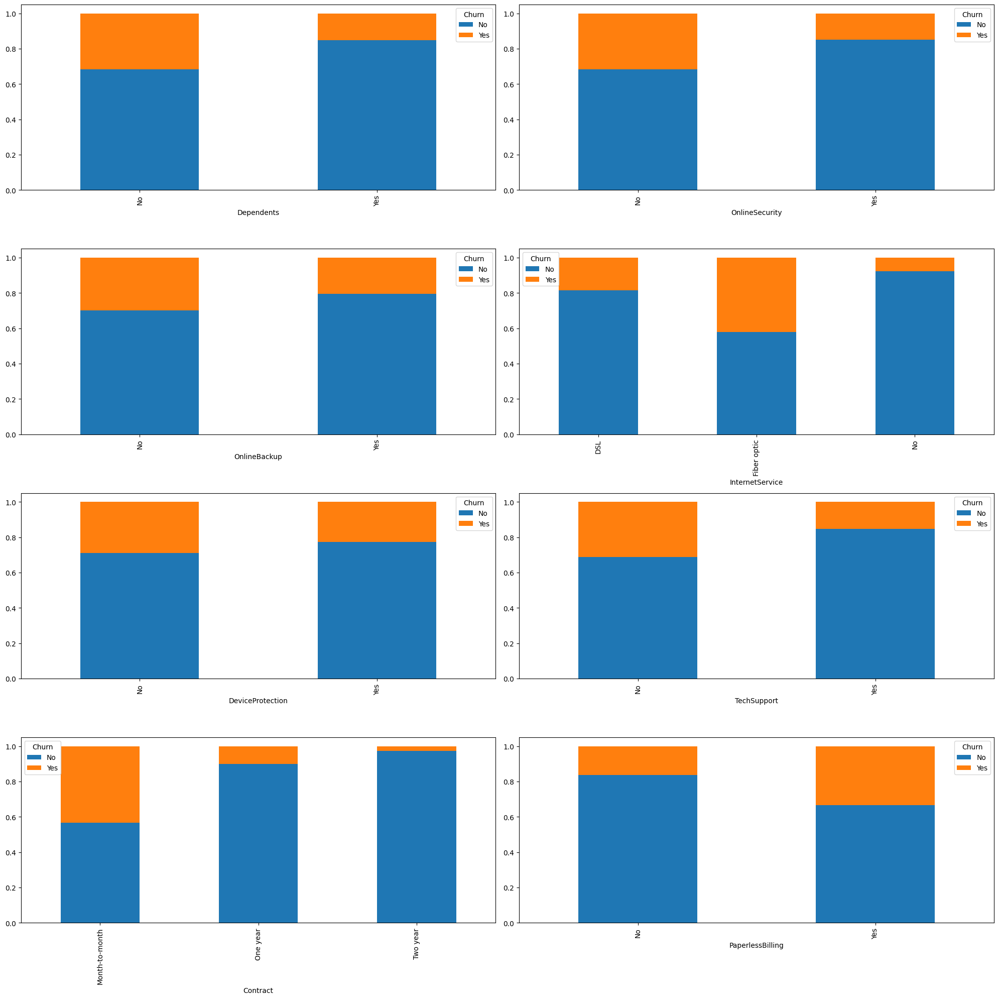

In [51]:
count = 0
fig = plt.figure(figsize=(20,20))

for i in df.drop(columns=['Churn','tenure','MonthlyCharges']).columns:
    count +=1
    ax= plt.subplot(4,2,count)
    pd.crosstab(df[i],df['Churn'],normalize=0).plot(kind='bar',stacked=True,ax=ax)
    fig.tight_layout()

plt.show()

In [52]:
for i in df.drop(columns=['Churn','tenure','MonthlyCharges']).columns:
    relevent_experience_df = df.groupby(i)['Churn'].value_counts(normalize=True).unstack()
    display(relevent_experience_df)

Churn,No,Yes
Dependents,,
No,0.683401,0.316599
Yes,0.848383,0.151617


Churn,No,Yes
OnlineSecurity,,
No,0.684301,0.315699
Yes,0.852059,0.147941


Churn,No,Yes
OnlineBackup,,
No,0.700062,0.299938
Yes,0.795428,0.204572


Churn,No,Yes
InternetService,,
DSL,0.813599,0.186401
Fiber optic,0.578269,0.421731
No,0.922053,0.077947


Churn,No,Yes
DeviceProtection,,
No,0.711859,0.288141
Yes,0.773641,0.226359


Churn,No,Yes
TechSupport,,
No,0.686843,0.313157
Yes,0.848335,0.151665


Churn,No,Yes
Contract,,
Month-to-month,0.567071,0.432929
One year,0.899240,0.100760
Two year,0.972342,0.027658


Churn,No,Yes
PaperlessBilling,,
No,0.835276,0.164724
Yes,0.664863,0.335137


Berdasarkan barplot dan tabel diatas kita dapat menyimpulkan beberapa hal :

1. Customer yang tidak memiliki tanggungan cenderung untuk churn dibandingkan yang memiliki tanggugan. Customer yang tidak memiliki tanggungan cenderung memiliki fleksibilitas yang lebih tinggi. Mereka memiliki kebebasan untuk memilih dan berpindah antaroperator tanpa harus mempertimbangkan dampak tanggungan finansial yang ada. Jika ada operator lain yang menawarkan paket atau layanan yang lebih sesuai dengan kebutuhan mereka, mereka dapat dengan mudah beralih tanpa harus memikirkan konsekuensi tanggungan yang harus mereka bayar.
2. Customer yang tidak memiliki online secutiy cenderung untuk churn dibandingkan yang memiliki online security.
3. Customer yang tidak memiliki online backup cenderung untuk churn dibandingkan yang memiliki online backup.
4. Customer yang layanan interntnya menggungan fiber optic cenderung untuk churn dibandingkan yang lainnya. Layanan internet fiber optic cenderung lebih mahal dibandingkan dengan teknologi lain seperti DSL atau kabel. Jika customer menghadapi tekanan finansial atau menemukan alternatif yang lebih murah dengan kualitas yang dapat diterima, mereka mungkin cenderung beralih ke penyedia layanan yang menawarkan harga yang lebih kompetitif. Hal ini terutama berlaku jika customer merasa bahwa manfaat tambahan dari fiber optic tidak sebanding dengan biaya yang mereka keluarkan.
5. Customer yang tidak memiliki device protection cenderung untuk churn dibandingkan yang memiliki.
6. Customer yang tidak memiliki dukungan teknis cenderung untuk churn dibandingkan yang memiliki. anpa dukungan teknis yang memadai, customer mungkin menghadapi masalah teknis yang tidak dapat mereka selesaikan sendiri. Ini dapat mencakup masalah kinerja, kegagalan sistem, atau kesalahan yang berulang. Jika masalah tersebut tidak diselesaikan dengan cepat atau secara memuaskan, customer mungkin merasa frustasi dan kecewa, yang dapat mendorong mereka untuk berhenti menggunakan layanan.
7. Customer yang memakai kontark month-to-month cenderung untuk churn dibandingkan jenis kontrak lainnya. Kontrak bulanan memberikan customer fleksibilitas yang lebih besar dalam memutuskan kapan mereka ingin menghentikan layanan. Mereka tidak terikat oleh komitmen jangka panjang dan dapat dengan mudah berhenti menggunakan layanan setelah satu bulan. Jika customer merasa bahwa layanan tersebut tidak memenuhi harapan mereka atau mereka menemukan alternatif yang lebih baik, mereka dapat dengan cepat beralih atau berhenti menggunakan layanan tersebut. Kestabilan keungan dan engagement dari penyedia layanan adalah beberapa faktor yang mendorong untuk berhenti menggunakan layanan.
8. Customer yang menerima tagihan paperless cenderung untuk churn dibandingkan yang paper based. Dengan menerima tagihan paperless, customer harus secara aktif terlibat dalam proses pembayaran online dan memiliki kesadaran yang lebih tinggi terhadap tagihan mereka. Mereka mungkin lebih cenderung melihat jumlah tagihan dan mempertimbangkan kebutuhan atau pengeluaran lainnya sebelum memutuskan untuk membayar. Ini dapat memicu pertimbangan lebih menyeluruh tentang nilai dan manfaat layanan yang mereka terima, yang pada gilirannya dapat mempengaruhi keputusan mereka untuk tetap menggunakan layanan tersebut.


---
## Data Preparation 


Data yang digunakan dalam model prediksi seringkali tidak dalam kondisi yang sempurna. Data akan perlu dilakuakan penskalaan dan normalitas serta encodung untuk variabel kategori atau dalam kata lain merapikan data sehingga memungkinkan model prediksi untuk bekerja dan menghasilkan hasil yang lebih akurat.

**Cek Imbalance:**

Churn
No     3614
Yes    1316
Name: count, dtype: int64


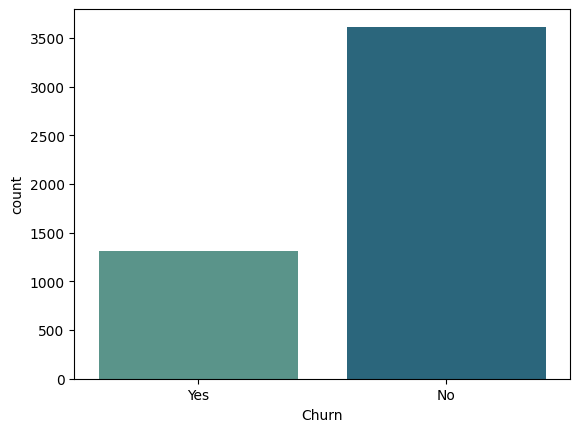

In [53]:
print(df['Churn'].value_counts())
_ = sns.countplot(x='Churn', data=df, palette='crest')

Dilihat dari barplot diatas terdapat ketidakseimbangan antara data customer yang churn dan tidak. Oleh karenanya dalam proses model benchmarking akan dilakukan handling imbalance dengan berbagai teknik untuk mengatasi hal ini. Ada kemungkinan bahwa dataset juga tidak perlu handling imbalance, setiap opsi akan dilakukan untuk mendapatkan hasil model yang terbaik.

**Mapping & Binning:**

In [54]:
# Mapping Target Value
label_mapping = {'No':0, 'Yes': 1}
df['Churn'] = df['Churn'].map(label_mapping)

# Binning 'tenure' feature kedalam 6 kategori range
condition = [((df.tenure >= 0)&(df.tenure <= 12)), ((df.tenure > 12)&(df.tenure <= 24)), 
                ((df.tenure > 24)&(df.tenure <= 36)),((df.tenure > 36)&(df.tenure <= 48)),
                ((df.tenure > 48)&(df.tenure <= 60)), (df.tenure > 60)]
choice = [0, 1, 2, 3, 4, 5] # (0 = 0-1year, 1 = 1-2years, 2 = 2-3years, 3 = 3-4years, 4 = 4-5years, 5 = more than 5 years)
df['tenure'] = np.select(condition, choice)
df.head()

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges,Churn
0,Yes,0,No,No,DSL,Yes,Yes,Month-to-month,Yes,72.90,1
1,No,1,No,Yes,Fiber optic,Yes,No,Month-to-month,Yes,82.65,0
2,No,5,Yes,No,DSL,Yes,Yes,Two year,No,47.85,1
3,No,5,Yes,Yes,DSL,Yes,Yes,Two year,No,69.65,0
4,No,0,No,No,No,No,No,Month-to-month,Yes,23.60,0


Feature `tenure` dilakukan binning berdasarkan tahunan untuk mempermudah interpretasi dan pemahaman data. Dengan mengelompokkan data tenure menjadi tahunan dapat mengurangi dimensi variabel menjadi jumlah tahun yang relevan. Ini membantu mengurangi kompleksitas model dan menghindari overfitting yang mungkin terjadi jika kita mempertimbangkan setiap titik data individu. Mengurangi dimensi data juga dapat meningkatkan kinerja model, mengurangi waktu komputasi, dan meningkatkan interpretasi hasil.

**Encoding & Scaling:**

Feature akan dilakukan proses encoding & scaling sesuai tipe dan karakter dari masing-masing feature. Pada dataset ini, semua feature numerik akan dilakukan scaling dengan standard scaler, dan semua feature category akan di encoding dengan onehot encoder

- OneHot Encoder : 'Dependents','OnlineSecurity', 'OnlineBackup', 'InternetService', 'DeviceProtection', 'TechSupport', 'Contract','PaperlessBilling'

OneHot Encoder digunakan karena semua feature kategori memiliki unique value yang sedikit dan juga tidak memiliki nilai urutan dari masing-masing valuenya.

- Standard Scaler : 'tenure', 'MonthlyCharges'

Standard Scaler disini digunakan untuk menjaga bentuk distribusi data asli saat melakukan penskalaan. Hal ini berguna dalam algoritma yang bergantung pada asumsi normalitas atau untuk menganalisis distribusi data yang sebanding. Selain itu standrd scaler dapat menjaga interpretabilitas, nilai-nilai yang dihasilkan akan memiliki interpretasi yang mudah dipahami. Setiap perubahan satuan standar dalam fitur akan berkorelasi dengan perubahan koeffisien yang sama dalam model, sehingga memudahkan interpretasi dampak fitur-fitur terhadap hasil prediksi.


In [55]:
transformer = ColumnTransformer([
    ('onehot', OneHotEncoder(drop='first'), ['InternetService', 'Contract','Dependents','OnlineSecurity', 'OnlineBackup',  'DeviceProtection', 'TechSupport', 'PaperlessBilling']),
    ('standard', StandardScaler(), ['tenure', 'MonthlyCharges'])
], remainder='passthrough')

transformer


ColumnTransformer(remainder='passthrough',
                  transformers=[('onehot', OneHotEncoder(drop='first'),
                                 ['InternetService', 'Contract', 'Dependents',
                                  'OnlineSecurity', 'OnlineBackup',
                                  'DeviceProtection', 'TechSupport',
                                  'PaperlessBilling']),
                                ('standard', StandardScaler(),
                                 ['tenure', 'MonthlyCharges'])])

---
# Modeling & Evaluation

Modeling akan dilakukan pada bagian ini untuk mencari hasil score metrics terbaik yang dapat memberikan keuntungan bagi stakeholder. Berbagai kombinasi treatment akan diuji untuk mendapatkan model terbaik dengan evaluasi di setiap perlakuan, metric yang digunakan untuk mengukur baiknya suatu model juga akan dianalisa dan dipilih mana yang sesuai dan relevan dengan kondisi bisnis sehingga didapatkan hasil terbaik dan tepat guna.

**Define Features & Target:**

In [56]:
X = df.drop(columns=['Churn'])
y = df['Churn']

In [57]:
y.value_counts()

Churn
0    3614
1    1316
Name: count, dtype: int64

**Data Splitting:**

Pemisahan data menjadi rasio 80:20 dalam pemodelan akan digunakan karena memungkinkan penggunaan sebagian besar data untuk melatih model dan memastikan representasi yang memadai. Dengan menyisihkan 20% data untuk pengujian, dapat diuji seberapa baik model dapat melakukan prediksi pada data yang belum pernah dilihat sebelumnya, sementara 80% sisanya memberikan jumlah data yang mencukupi untuk melatih model dengan baik.

In [58]:
X_train,X_test,y_train,y_test=train_test_split(X,y,stratify=y,test_size=0.2,random_state=42)

In [59]:
y_train.value_counts()

Churn
0    2891
1    1053
Name: count, dtype: int64

**Model Benchmark:**

Bagian ini akan dilakukan model benchmarking dengan berbagai varian algortima dan treatment imbalance dan juga dilakukan cross validation. Hal ini dilakukan untuk memperoleh perkiraan yang dapat diandalkan tentang seberapa baik model akan berkinerja pada data yang belum pernah dilihat sebelumnya.

In [60]:
# Base Model (Basic ML algorithm)
logreg = LogisticRegression(random_state=42,class_weight='balanced')
knn = KNeighborsClassifier()
tree = DecisionTreeClassifier(random_state=42,class_weight='balanced')

# Modern Algorithm
xgb = XGBClassifier(random_state = 42)
lgbm = LGBMClassifier(random_state = 42,class_weight='balanced')
cat = CatBoostClassifier(random_state=42, verbose=False)
rf = RandomForestClassifier(random_state=42,class_weight='balanced')
gboost = GradientBoostingClassifier(random_state=42)
bag = BaggingClassifier(random_state=42)
ada = AdaBoostClassifier(random_state=42)


In [61]:
f2_score = make_scorer(fbeta_score, beta=2)

list_model = [logreg, knn, tree, rf, gboost, xgb, cat, lgbm, bag, ada]

ros = RandomOverSampler(random_state=42)
rus = RandomUnderSampler(random_state=42)
smote = SMOTE(random_state=42)
near = NearMiss()

resample = {
    'none': None,
    'ros': ros,
    'rus': rus,
    'smote': smote,
    'near': near,
}

metrics = {'balanced_accuracy': 'balanced_accuracy',
           'precision': 'precision',
           'recall': 'recall',
           'f1': 'f1',
           'f2': f2_score}

fit_time_arr = []
score_time_arr = []     
test_accuracy_arr = []    
test_precision_arr = []
test_recall_arr = []
test_f1_arr = []
test_f2_arr = []
auc_roc_arr = []


for key,val in resample.items():
    for i in list_model:
        crossval = StratifiedKFold(n_splits=5)

        if val == None:
            estimator = Pipeline([
                ('transorm', transformer),
                ('model', i),
            ])
        else:
            estimator = Pipeline([
                ('transorm', transformer),
                ('resample', val),
                ('model', i),
            ])

        scores = cross_validate(estimator, X_train, y_train,cv=crossval, scoring=metrics)
        fit_time_arr.append(scores['fit_time'].mean())
        score_time_arr.append(scores['score_time'].mean())
        test_accuracy_arr.append(scores['test_balanced_accuracy'].mean())
        test_precision_arr.append(scores['test_precision'].mean())
        test_recall_arr.append(scores['test_recall'].mean())
        test_f1_arr.append(scores['test_f1'].mean())
        test_f2_arr.append(scores['test_f2'].mean())
        
        y_pred_proba = estimator.fit(X_train, y_train).predict_proba(X_train)
        auc_roc = roc_auc_score(y_train, y_pred_proba[:, 1])
        auc_roc_arr.append(auc_roc)

list_algo = []
list_resample = []


for key in resample.keys():
    for mod in ['logreg', 'knn', 'tree', 'rf', 'gboost', 'xgb', 'cat', 'lgbm','bag','ada']: 
        list_algo.append(mod)
        list_resample.append(key)

model_bench = pd.DataFrame({
    'model': list_algo,
    'resample': list_resample,
    'fit_time': fit_time_arr,
    'score_time': score_time_arr,
    'accuracy': test_accuracy_arr,
    'precision': test_precision_arr,
    'recall': test_recall_arr,
    'f1': test_f1_arr,
    'f2': test_f2_arr,
})


Pada kasus ini, fokus utama ditujukan untuk mencari customer yang terindikasi untuk churn agar perusahaan dapat fokus untuk melakukan tindakan retensi kepada customer yang tepat. Dalam hal ini model harus bisa meminimalkan kesalahan dalam memprediksi yang aktualnya customer terindikasi akan churn namun disisi lain tetap harus bisa mengindikasi juga customer yang sebetulnya tidak perlu tindakan retensi karena tidak akan churn sehingga tidak ada biaya operasional yang keluar sia-sia. Dari permasalahan teresebut, metrics F2 digunakan sebagai patokan untuk memilih model dan resample mana yang akan dikaji dan dievaluasi lebih lanjut. Dari hasil dibawah akan dipilih tiga model terbaik yang akan dievaluasi lebih lanjut.

In [62]:
model_bench.sort_values('f2', ascending=False).head(10)

,model,resample,fit_time,score_time,accuracy,precision,recall,f1,f2
29,ada,rus,0.123891,0.026001,0.755662,0.500388,0.805331,0.616795,0.717380
19,ada,ros,0.172179,0.025295,0.759276,0.512223,0.794918,0.622562,0.715472
39,ada,smote,0.263582,0.034793,0.759927,0.519845,0.784459,0.624961,0.711647
20,logreg,rus,0.024039,0.014016,0.754909,0.506045,0.792065,0.617229,0.711311
10,logreg,ros,0.030384,0.013943,0.757683,0.515635,0.784464,0.621819,0.709971
30,logreg,smote,0.037911,0.013976,0.755074,0.508414,0.788246,0.617907,0.709859
0,logreg,none,0.042081,0.023359,0.756034,0.511220,0.786360,0.619324,0.709656
26,cat,rus,1.279978,0.019815,0.747662,0.493654,0.791063,0.607847,0.705908
24,gboost,rus,0.186422,0.015262,0.747033,0.493624,0.790147,0.607380,0.705138
14,gboost,ros,0.362658,0.015627,0.748838,0.517700,0.755012,0.613614,0.691033


Dari hasil benchmarking yang mengurutkan dari score F2, dipilih 3 model terbaik yaitu Adaboost, Logistic Regression, dan Catboost dengan teknik resample yang digunakan adalah Random Over Sampling. Model tersebut akan dievaluasi lebih lanjut dengan melakukan hyperparameter tuning dan juga membandingkan prioritas metrics yang digunakan antara Recall dan F2. Tujuannya adalah untuk mendapatkan hasil yang paling memberikan keuntungan bagi perusahaan.

**Before Tuning:**

Model dari hasil benchmarking akan digunakan untuk memprediksi sample test.

In [63]:
score_accuracy = []
score_precision = []
score_recall = []
score_f1 = []
score_f2 = []
arr_y_pred = []
list_model = [ada, logreg, cat]

for i in list_model:
    model = Pipeline([
    ('transform', transformer),
    ('resampling', rus),
    ('model', i)
])
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score_accuracy.append(accuracy_score(y_test, y_pred))
    score_precision.append(precision_score(y_test, y_pred))
    score_recall.append(recall_score(y_test, y_pred))
    score_f1.append(f1_score(y_test, y_pred))
    score_f2.append(fbeta_score(y_test, y_pred, beta=2))
    arr_y_pred.append(y_pred)
        

list_algo = []

for mod in ['Adaboost RUS Before Tuning', 'Logreg RUS Before Tuning', 'Catboost RUS Before Tuning']: 
    list_algo.append(mod)

score_before_tuning = pd.DataFrame({'Model': list_algo,
                                    'Accuracy': score_accuracy, 
                                    'Precision': score_precision, 
                                    'Recall': score_recall, 
                                    'F1': score_f1,
                                    'F2': score_f2
                                    })
score_before_tuning

,Model,Accuracy,Precision,Recall,F1,F2
0,Adaboost RUS Before Tuning,0.748479,0.517815,0.828897,0.637427,0.739986
1,Logreg RUS Before Tuning,0.751521,0.521635,0.825095,0.639175,0.739101
2,Catboost RUS Before Tuning,0.748479,0.517815,0.828897,0.637427,0.739986


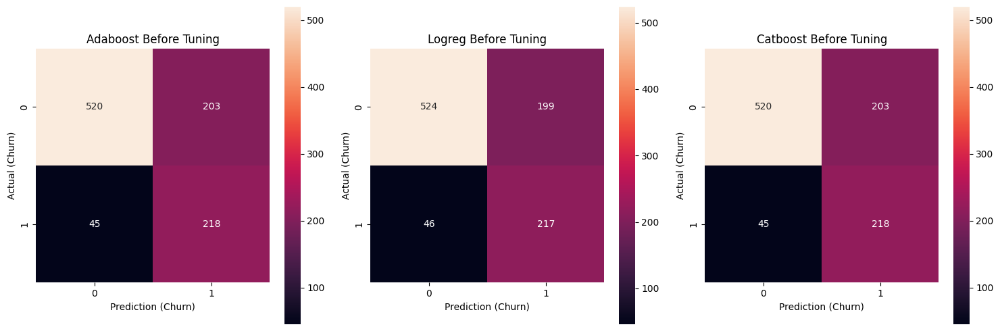

In [64]:
models = ['Adaboost', 'Logreg', 'Catboost']

plt.figure(figsize=(15, 5))

for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.heatmap(confusion_matrix(y_test, arr_y_pred[i]), annot=True, fmt='.0f', square=True)
    plt.xlabel('Prediction (Churn)')
    plt.ylabel('Actual (Churn)')
    plt.title(f'{models[i]} Before Tuning')

plt.tight_layout()
plt.show()

Pada confussion matrix diatas didapatkan hasil prediksi untuk sample test, mengacu pada score F2 didapat bahwa model Adaboost dan Catboost adalah model terbaik. Untuk mendapatkan hasil terbaik selanjutnya akan dilakukan hyperparameter tuning dan dievalusi kembali.

**Hyperparameter Tuning:**

Pada bagian ini setiap model akan dilakukan hyperparameter tuning untuk mencapai model yang memiliki performa terbaik dengan menggunakan kombinasi hyperparameter yang optimal dan meningkatkan score metrics. Pada proses kali ini akan dipilih dua metrics yang menjadi prioritas untuk ditingkatkan dalam melakukan hyperparameter tuning, metrics yang dipilih adalah Recall dan F2. Model bertujuan untuk dapat mengidentifikasi customer yang terindikasi churn agar dapat dilakukan strategi retensi sehingga diperlukan untuk meminimalkan kesalahan gagal mengdentifikasi customer yang aktulanya akan churn dan untuk problem seperti ini metrics recall dapat menjadi tolak ukur baiknya model ini. Disisi lain dalam konteks bisnis perusahaan juga perlu memperhatikan biaya operasional yang dikeluarkan dan dalam hal ini model harus dapat memperhatikan kesalahan dalam mengidentifikasi customer yang sebenarnya tidak perlu treatment retensi agar perusahaan tidak mengeluarkan biaya yang tidak seharusnya keluar, metrics yang sesuai untuk problem ini yaitu F2. Dengan alasan tersebut dibuat perbandingan antara kedua metrics dan akan dikaji mana yang ternyata lebih menguntungkan bagi perusahaan.

In [65]:
scorer = make_scorer(fbeta_score, beta=2)
def perform_grid_search(model, param_grid, scoring):
    model = Pipeline([
        ('transformer', transformer),
        ('resampling', rus),
        ('model', model)
    ])
    
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=5,
        scoring=scoring,
        n_jobs=-1
    )
    
    return grid_search

# Hyperparameter space 
ada_hyperparam_space = {
    'model__n_estimators': [50, 100, 150, 200],
    'model__learning_rate': [0.1, 1.0, 10.0],
    'model__base_estimator': [DecisionTreeClassifier(max_depth=1), DecisionTreeClassifier(max_depth=2)],
    'model__algorithm': ['SAMME', 'SAMME.R'], 
}

logreg_hyperparam_space = {
    'model__C': [0.1, 1.0, 10.0],
    'model__penalty': ['l1', 'l2'],
    'model__solver': ['liblinear', 'saga'],
    'model__fit_intercept': [True, False],
    'model__max_iter': [50, 100, 150, 200],   
}

cat_hyperparam_space = { 
    'model__depth': [i for i in range (1,7,1)],
    'model__iterations': [100, 150, 200, 250, 300],
    'model__learning_rate': [0.1, 0.01, 0.001]  
}


# Perform grid search for f2 score
ada_gridsearch_f2 = perform_grid_search(AdaBoostClassifier(), ada_hyperparam_space, scorer)
logreg_gridsearch_f2 = perform_grid_search(LogisticRegression(), logreg_hyperparam_space, scorer)
cat_gridsearch_f2 = perform_grid_search(CatBoostClassifier(), cat_hyperparam_space, scorer)

# Perform grid search for recall score
ada_gridsearch_recall = perform_grid_search(AdaBoostClassifier(), ada_hyperparam_space, 'recall')
logreg_gridsearch_recall = perform_grid_search(LogisticRegression(), logreg_hyperparam_space, 'recall')
cat_gridsearch_recall = perform_grid_search(CatBoostClassifier(), cat_hyperparam_space, 'recall')



Berikut adalah penjelasan parameter yang dilakukan tuning untuk masing-masing model:

- Adaabost:
    1. n_estimators: Ini adalah jumlah maksimum dari estimator yang akan digunakan dalam Adaboost. Estimator dalam Adaboost adalah model yang digunakan untuk melakukan prediksi. Parameter ini memungkinkan Anda untuk mengatur jumlah model keputusan (decision tree) yang akan dibangun dalam proses Adaboost.

    2. learning_rate: Ini adalah tingkat pembelajaran (learning rate) yang digunakan dalam proses pembelajaran Adaboost. Parameter ini mengontrol seberapa cepat model belajar dari kesalahan prediksi sebelumnya. Tingkat pembelajaran yang lebih rendah cenderung menghasilkan konvergensi yang lebih lambat tetapi mungkin memberikan hasil yang lebih baik.

    3. base_estimator: Ini adalah estimator dasar yang digunakan dalam Adaboost. Estimator ini digunakan untuk membuat prediksi awal dan kemudian iteratif ditingkatkan oleh estimator tambahan dalam Adaboost.

    4. algorithm: Ini adalah algoritma yang digunakan dalam proses Adaboost. Ada dua pilihan dalam hyperparameter space ini: 'SAMME' dan 'SAMME.R'. 'SAMME' mengacu pada Algoritma Adaboost Multiclass dengan Error rate (tingkat kesalahan) yang disesuaikan. 'SAMME.R' adalah varian dari 'SAMME' yang menggunakan probabilitas perkiraan sebagai skor berat untuk meningkatkan kinerja model. Pilihan ini memungkinkan Anda untuk memilih algoritma yang sesuai dengan kebutuhan Anda dalam konteks masalah klasifikasi multikelas.

- Logistic Regression:
    1. C: Ini adalah parameter kebalikan dari kekuatan regulasi dalam Regresi Logistik. Semakin kecil nilai C, semakin kuat regulasi yang diterapkan pada model. Regulasi membantu mengendalikan kompleksitas model dan mencegah overfitting. 

    2. penalty: Ini adalah jenis regulasi yang digunakan dalam Regresi Logistik. Dua pilihan umum adalah 'l1' dan 'l2'. 'l1' mengacu pada regulasi L1 (Lasso regularization), yang cenderung menghasilkan model yang jarang dengan beberapa fitur yang memiliki bobot nol. 'l2' mengacu pada regulasi L2 (Ridge regularization), yang cenderung menghasilkan model yang mempertahankan semua fitur dengan bobot yang lebih kecil.

    3. solver: Ini adalah algoritma solver yang digunakan dalam proses optimisasi Regresi Logistik. Solver digunakan untuk mencari parameter model yang optimal berdasarkan fungsi kerugian dan fungsi regulasi. Dalam hyperparameter space ini, ada dua pilihan: 'liblinear' dan 'saga'. 'liblinear' adalah solver yang efisien untuk masalah regresi logistik dengan regulasi L1 dan L2. 'saga' adalah solver yang dioptimalkan untuk masalah regresi logistik dengan regulasi L1 dan L2, terutama pada data yang besar. 

    4. fit_intercept: Ini adalah parameter yang menentukan apakah model Regresi Logistik akan memiliki intercept (konstanta) atau tidak. Jika nilai fit_intercept adalah True, maka model akan memperhitungkan intercept dalam prediksinya. Jika nilai fit_intercept adalah False, maka model tidak akan memperhitungkan intercept. 

    5. max_iter: Ini adalah jumlah maksimum iterasi yang akan dilakukan oleh solver dalam proses optimisasi Regresi Logistik. Jumlah iterasi ini mengontrol seberapa lama solver akan mencoba menemukan parameter model yang optimal sebelum menghentikan proses. Jika konvergensi belum tercapai dalam jumlah iterasi ini, solver akan menghentikan proses dan mengembalikan hasil yang ada. 

- Catboost:
    1. depth: Ini adalah kedalaman maksimum dari pohon keputusan dalam model CatBoost. Kedalaman pohon mempengaruhi kompleksitas model dan kemampuannya untuk mempelajari hubungan yang lebih kompleks dalam data.

    2. iterations: Ini adalah jumlah maksimum iterasi (rundown) yang akan dilakukan oleh model CatBoost. Setiap iterasi menambahkan satu pohon keputusan ke dalam model. Semakin banyak iterasi, semakin banyak pohon yang akan digunakan dalam model.

    3. learning_rate: Ini adalah tingkat pembelajaran (learning rate) yang digunakan dalam model CatBoost. Tingkat pembelajaran mengontrol seberapa cepat model belajar dari kesalahan prediksi sebelumnya. Tingkat pembelajaran yang lebih tinggi cenderung mengarah pada konvergensi yang lebih cepat tetapi juga meningkatkan risiko overfitting. 

In [66]:
def fit_model(grid_search, X_train, y_train):
    grid_search.fit(X_train, y_train)
    tuned_model = grid_search.best_estimator_
    tuned_model.fit(X_train, y_train)
    return tuned_model

# Fitting Adaboost model
ada_tuning_f2 = fit_model(ada_gridsearch_f2, X_train, y_train)
ada_tuning_recall = fit_model(ada_gridsearch_recall, X_train, y_train)

# Fitting Logistic Regression model
logreg_tuning_f2 = fit_model(logreg_gridsearch_f2, X_train, y_train)
logreg_tuning_recall = fit_model(logreg_gridsearch_recall, X_train, y_train)

# Fitting Catboost model
cat_tuning_f2 = fit_model(cat_gridsearch_f2, X_train, y_train)
cat_tuning_recall = fit_model(cat_gridsearch_recall, X_train, y_train)


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/

0:	learn: 0.6792118	total: 373us	remaining: 37ms
0:	learn: 0.6809924	total: 334us	remaining: 33.1ms
1:	learn: 0.6677990	total: 757us	remaining: 37.1ms
1:	learn: 0.6710286	total: 678us	remaining: 33.2ms
2:	learn: 0.6583360	total: 1.1ms	remaining: 35.5ms
2:	learn: 0.6627736	total: 979us	remaining: 31.7ms
3:	learn: 0.6494417	total: 1.35ms	remaining: 32.5ms
3:	learn: 0.6536137	total: 1.27ms	remaining: 30.6ms
4:	learn: 0.6407750	total: 1.61ms	remaining: 30.6ms
4:	learn: 0.6459168	total: 1.56ms	remaining: 29.6ms
5:	learn: 0.6300438	total: 1.85ms	remaining: 29ms
5:	learn: 0.6394814	total: 1.82ms	remaining: 28.6ms
6:	learn: 0.6213014	total: 2.09ms	remaining: 27.8ms
7:	learn: 0.6154725	total: 2.4ms	remaining: 27.6ms
6:	learn: 0.6296906	total: 2.3ms	remaining: 30.5ms
8:	learn: 0.6089075	total: 2.69ms	remaining: 27.3ms
7:	learn: 0.6217175	total: 2.68ms	remaining: 30.8ms
0:	learn: 0.6808607	total: 916us	remaining: 90.7ms
9:	learn: 0.6016993	total: 2.96ms	remaining: 26.6ms
8:	learn: 0.6152160	total

**Best Paramater:**

In [67]:
# Adaboost - F2
ada_best_params_f2 = ada_gridsearch_f2.best_params_
print("Adaboost - F2 Best Parameters:", ada_best_params_f2)

# Adaboost - Recall
ada_best_params_recall = ada_gridsearch_recall.best_params_
print("Adaboost - Recall Best Parameters:", ada_best_params_recall)

# Logistic Regression - F2
logreg_best_params_f2 = logreg_gridsearch_f2.best_params_
print("Logistic Regression - F2 Best Parameters:", logreg_best_params_f2)

# Logistic Regression - Recall
logreg_best_params_recall = logreg_gridsearch_recall.best_params_
print("Logistic Regression - Recall Best Parameters:", logreg_best_params_recall)

# Catboost - F2
cat_best_params_f2 = cat_gridsearch_f2.best_params_
print("Catboost - F2 Best Parameters:", cat_best_params_f2)

# Catboost - Recall
cat_best_params_recall = cat_gridsearch_recall.best_params_
print("Catboost - Recall Best Parameters:", cat_best_params_recall)


Adaboost - F2 Best Parameters: {'model__algorithm': 'SAMME.R', 'model__base_estimator': DecisionTreeClassifier(max_depth=2), 'model__learning_rate': 10.0, 'model__n_estimators': 150}
Adaboost - Recall Best Parameters: {'model__algorithm': 'SAMME', 'model__base_estimator': DecisionTreeClassifier(max_depth=1), 'model__learning_rate': 10.0, 'model__n_estimators': 50}
Logistic Regression - F2 Best Parameters: {'model__C': 0.1, 'model__fit_intercept': True, 'model__max_iter': 50, 'model__penalty': 'l1', 'model__solver': 'saga'}
Logistic Regression - Recall Best Parameters: {'model__C': 0.1, 'model__fit_intercept': True, 'model__max_iter': 50, 'model__penalty': 'l1', 'model__solver': 'saga'}
Catboost - F2 Best Parameters: {'model__depth': 2, 'model__iterations': 150, 'model__learning_rate': 0.001}
Catboost - Recall Best Parameters: {'model__depth': 1, 'model__iterations': 100, 'model__learning_rate': 0.001}


**Result Aftre Tuning:**

In [68]:
models = {
    'ada_tuning_f2': ada_tuning_f2,
    'logreg_tuning_f2': logreg_tuning_f2,
    'cat_tuning_f2': cat_tuning_f2,
    'ada_tuning_recall': ada_tuning_recall,
    'logreg_tuning_recall': logreg_tuning_recall,
    'cat_tuning_recall': cat_tuning_recall
}

metrics = ['accuracy', 'precision', 'recall', 'f1', 'f2']
results = []
arr_y_pred_tuning = []

for model_name, model in models.items():
    y_pred = model.predict(X_test)
    arr_y_pred_tuning.append(y_pred)
    scores = {
        'Model': model_name,
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1': f1_score(y_test, y_pred),
        'F2': fbeta_score(y_test, y_pred, beta=2)
    }
    results.append(scores)

score_after_tuning = pd.DataFrame(results)

score_after_tuning


,Model,Accuracy,Precision,Recall,F1,F2
0,ada_tuning_f2,0.672414,0.444853,0.920152,0.599752,0.758145
1,logreg_tuning_f2,0.756592,0.527711,0.832700,0.646018,0.746421
2,cat_tuning_f2,0.709939,0.476673,0.893536,0.621693,0.760518
3,ada_tuning_recall,0.504057,0.349333,0.996198,0.517275,0.726970
4,logreg_tuning_recall,0.756592,0.527711,0.832700,0.646018,0.746421
5,cat_tuning_recall,0.624746,0.411570,0.946768,0.573733,0.751358


In [69]:
score_before_tuning

,Model,Accuracy,Precision,Recall,F1,F2
0,Adaboost RUS Before Tuning,0.748479,0.517815,0.828897,0.637427,0.739986
1,Logreg RUS Before Tuning,0.751521,0.521635,0.825095,0.639175,0.739101
2,Catboost RUS Before Tuning,0.748479,0.517815,0.828897,0.637427,0.739986


**Benchmark Confussion Matrix:**

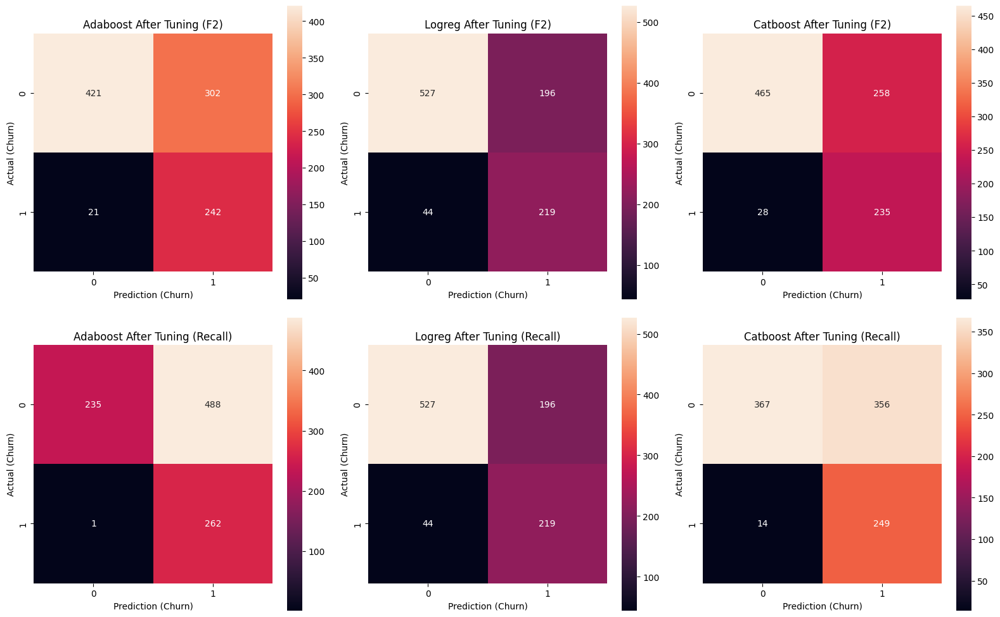

In [70]:
# Create a list of model names
model_names = ['Adaboost After Tuning (F2)', 'Logreg After Tuning (F2)', 'Catboost After Tuning (F2)',
               'Adaboost After Tuning (Recall)', 'Logreg After Tuning (Recall)', 'Catboost After Tuning (Recall)']

# Create a list of confusion matrices for each model
confusion_matrices = [confusion_matrix(y_test, y_pred) for y_pred in arr_y_pred_tuning]

# Plot the confusion matrices using a loop
plt.figure(figsize=(16, 10))
for i in range(len(model_names)):
    plt.subplot(2, 3, i+1)
    sns.heatmap(confusion_matrices[i], annot=True, fmt='.0f', square=True)
    plt.xlabel('Prediction (Churn)')
    plt.ylabel('Actual (Churn)')
    plt.title(model_names[i])

plt.tight_layout()
plt.show()

Dari proses hyperparameter tuning, didapatkan hasil confussion matrix dari masing-masing opsi yang dapat dilihat diatas. Untuk memilih mana yang terbaik akan dikaji dari sisi bisnis yang terkait dengan case pada studi ini. Mengingat kembali tujuan utama pembuatan model ini adalah untuk perusahaan mengidentifikasi customer dengan risiko churn tinggi sehingga dapat dilakukan intervensi atau strategi retensi yang sesuai dan juga memaksimalkan prediksi yang tidak memiliki indikasi churn sehingga biaya operasional untuk penanganan dapat tersalurkan secara akurat untuk customer yang aktualnya memang churn. Mengutip dari website Outboundengine dengan artikel bertajuk [Customer Retention Marketing vs. Customer Acquisition Marketing](https://www.outboundengine.com/blog/customer-retention-marketing-vs-customer-acquisition-marketing/), dikatakan bahwa untuk mengakusisi customer baru bisa memakan biaya lima kali lebih banyak daripada mempertahankan customer yang sudah ada. 

Ada beberapa alasan mengapa biaya untuk mendapatkan customer baru bisa jauh lebih tinggi daripada mempertahankan customer yang sudah ada:

- Upaya Pemasaran: Untuk menarik customer baru, perusahaan harus mengeluarkan sumber daya dan biaya untuk melakukan berbagai upaya pemasaran. Ini termasuk iklan, promosi, kampanye pemasaran digital, strategi pemasaran konten, dan lain sebagainya. Semua ini memerlukan biaya yang signifikan untuk mencapai audiens yang relevan dan mendapatkan perhatian mereka.

- Pengenalan Merek: Ketika perusahaan mencoba menarik customer baru, mereka harus menginvestasikan waktu dan sumber daya untuk membangun kesadaran merek dan memperkenalkan nilai yang mereka tawarkan. Ini melibatkan biaya untuk mengembangkan pesan pemasaran yang efektif, kampanye merek, dan aktivitas promosi yang meningkatkan visibilitas perusahaan di pasar.

- Penelitian dan Pemahaman customer: Untuk menargetkan customer baru, perusahaan perlu melakukan penelitian pasar yang mendalam dan memahami preferensi, kebutuhan, dan perilaku customer potensial. Ini melibatkan biaya untuk mengumpulkan dan menganalisis data, melakukan survei, dan memahami tren pasar yang berkaitan dengan segmen target yang diinginkan.

- Upaya Penjualan: Setelah berhasil menarik perhatian customer potensial, perusahaan perlu mengalokasikan sumber daya untuk proses penjualan yang melibatkan interaksi dengan calon customer, presentasi produk atau layanan, negosiasi, dan aktivitas penjualan lainnya. Semua ini memerlukan biaya waktu, tenaga kerja, dan kemampuan penjualan yang berkualitas.

Di sisi lain, mempertahankan customer yang sudah ada biasanya lebih efisien dari segi biaya karena beberapa alasan:

- Keterikatan dan Loyalitas: customer yang sudah ada biasanya memiliki tingkat keterikatan dan loyalitas yang lebih tinggi terhadap merek atau perusahaan. Mereka telah membangun hubungan dan kepercayaan seiring waktu, sehingga mereka cenderung lebih mungkin untuk tetap menggunakan layanan atau produk yang telah mereka nikmati.

- Biaya Rendah dalam Mengomunikasikan Penawaran: Perusahaan tidak perlu mengeluarkan biaya besar untuk memperkenalkan merek atau nilai yang mereka tawarkan kepada customer yang sudah ada. Komunikasi pemasaran lebih mudah dilakukan karena customer sudah memiliki pengetahuan dan pengalaman dengan perusahaan tersebut.

- Nilai Berkelanjutan: customer yang tetap setia cenderung memberikan pendapatan yang berkelanjutan bagi perusahaan. Ini berarti perusahaan tidak perlu mengeluarkan biaya besar untuk mencapai target pendapatan tertentu yang mungkin diperlukan untuk customer baru.


Dengan dasar acuan diatas akan dikalkulasikan estimasi biaya dari masing-masing opsi yang ada sehingga bisa dipilih mana model terbaik yang bisa mencapai tujuan dengan biaya rendah. Berikut hasil dari kalkulasi yang dilakukan:


In [71]:
# Create empty lists to store the values
fn_values = []
fp_values = []
combined_values = []

# Iterate over the confusion matrices and calculate the values
for matrix in confusion_matrices:
    tn, fp, fn, tp = matrix.flatten()
    fn_values.append(fn)
    fp_values.append(fp)
    combined_values.append((fn * 5) + fp)

# Create the DataFrame
data_calc = {'Model': model_names, 'False Negative (FN)': fn_values, 'False Positive (FP)': fp_values, '(FN * 5) + FP': combined_values}
df_calc = pd.DataFrame(data_calc)

# Sort the DataFrame by '(FN * 5) + FP' column in descending order
df_sorted = df_calc.sort_values('(FN * 5) + FP', ascending=True)

# Apply formatting to the DataFrame
df_formatted = df_sorted.style.format({'False Negative (FN)': '{:.0f}', 'False Positive (FP)': '{:.0f}', '(FN * 5) + FP': '{:.0f}'})

# Display the formatted DataFrame
df_formatted

,Model,False Negative (FN),False Positive (FP),(FN * 5) + FP
2,Catboost After Tuning (F2),28,258,398
0,Adaboost After Tuning (F2),21,302,407
1,Logreg After Tuning (F2),44,196,416
4,Logreg After Tuning (Recall),44,196,416
5,Catboost After Tuning (Recall),14,356,426
3,Adaboost After Tuning (Recall),1,488,493


In [72]:
tn, fp, fn, tp = confusion_matrix(y_test, arr_y_pred_tuning[2]).flatten()
print(f"Customer yang churn dan tidak mendapatkan treatment", round(fn/(tn+fn)*100,2),"%")
print("Customer yang mendapatkan treatment namun aktualnya tidak terindikasi churn:", round(fp/(fp+tp)*100,2),"%")


Customer yang churn dan tidak mendapatkan treatment 5.68 %
Customer yang mendapatkan treatment namun aktualnya tidak terindikasi churn: 52.33 %


Hasil komparasi pengkali biaya yang dikeluarkan perusahaan untuk setiap opsi dapat dilihat pada tabel diatas. Didapatkan opsi model terbaik yang dapat mencapai tujuan dengan biaya terendah adalah Model dengan Algortima Catboost yang setelah dilakukan Hyperparameter Tuning dengan prioritas meningkat metric F2. Dari model terpilih didapatkan hasil score F2 nya sebesar 76,05%. Dari confusion matrix diatas, dapat disimpulkan untuk model terpilih bahwa dari 100 orang yang diprediksi, hanya 5,68% atau hanya 6 orang yang akan churn karena tidak mendapatkan treatment apa pun dari perusahaan agar tetap menggunakan layanan perusahaan. Dan kemudian, dari 100 orang yang diprediksi akan berhenti berlangganan (churn), sekitar 50,52,33% atau sekitar 52 orang akan mendapatkan treatment dari perusahaan, padahal sebenarnya mereka tidak memiliki masalah dengan layanan sampai membuat mereka untuk berhenti berlangganan. Dari hasil tersebut memang terlihat persentase untuk kesalahan prediksi customer yang mendapatkan treatment namun aktualnya tidak terindikasi churn terbilang tinggi yaitu 52.33%, namun dari semua opsi dengan setiap perlakuan yang telah dilakukan untuk modeling dari dataset yang ada memang inilah opsi terbaik agar model dapat mencapai tujuan dengan keuntungan maksimal bagi perusahaan. Namun kesalahan pemberian treatment kepada customer yang aktualnya tidak terindikasi churn tetap memiliki sisi positif yaitu memperkuat loyalitas customer dan mempertahankan basis customer yang kuat, yang pada akhirnya berdampak positif pada keberlanjutan bisnis dan pertumbuhan perusahaan. Dari hasil diatas juga dapat memperlihatkan apabila perusahaan hanya berfokus untuk meminimalkan

Pada projek kali ini Catboost terpilih menjadi algortima untuk model prediksi dataset Telco Customer Churn. CatBoost adalah algoritma yang dirancang untuk menangani dataset dengan fitur-fitur kategorikal dan memiliki kemampuan untuk mengatasi beberapa tantangan yang sering dihadapi dalam pemodelan prediktif, ini dapat menjadi alasan mengapa algoritma ini memiliki performa paling baik karena dataset Telco Customer Churn didominasi dengan fitur-fitur kategorikal. Teknik resample yang terpilih adalah Random Under Sample, proses random under-sampling melibatkan pemilihan secara acak sebagian sampel dari kelas mayoritas sehingga jumlahnya setara dengan jumlah sampel dari kelas minoritas. Dengan mengurangi jumlah sampel kelas mayoritas nantinya akan dapat mencapai keseimbangan antara kedua kelas dalam dataset.

**Feature Importance:**

Pada bagian ini akan dicari dan dianalisa fitur mana yang paling mempengaruhi terhadap target. Berikut hasil dari pengecekan feature importance beserta analisanya:

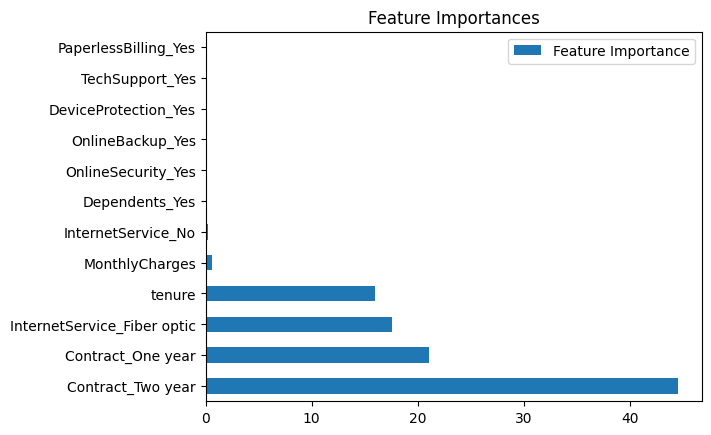

In [73]:
import pandas as pd
import matplotlib.pyplot as plt

# Dapatkan fitur-fitur teratas dari feature_importances_
feature_importances = cat_tuning_f2['model'].feature_importances_
feature_names = transformer.get_feature_names_out()
coef1 = pd.DataFrame({'Feature Importance': feature_importances}, index=feature_names)
coef1.index = coef1.index.str.split('__').str[-1]
coef1.sort_values(by='Feature Importance', ascending=False, inplace=True)

# Plot diagram batang
coef1.plot(kind='barh', title='Feature Importances')
plt.show()


Dari hasil pengecekan, didapatkan tiga fitur paling berpengaruh terhadap keputusan customer untuk churn yaitu `Contract`, `Internet Service`, dan `Tenure`. Berikut adalah beberapa analisis terkait fitur-fitur tersebut:

- Contract (Kontrak): Fitur ini memiliki pengaruh paling signifikan dalam memprediksi churn. Pelanggan dengan kontrak berjangka panjang, seperti kontrak dua tahun atau satu tahun, cenderung lebih stabil dan memiliki kemungkinan churn yang lebih rendah. Hal ini dapat disebabkan oleh keterikatan kontrak yang lebih kuat dan adanya potongan harga atau keuntungan lain yang ditawarkan dalam kontrak berjangka panjang. 

- Internet Service (Layanan Internet): Fitur ini juga memiliki pengaruh yang signifikan terhadap churn. Pelanggan yang menggunakan layanan internet berbasis serat optik cenderung memiliki tingkat churn yang lebih tinggi. Ini dapat disebabkan oleh faktor-faktor seperti masalah kualitas layanan, kecepatan, atau harga yang mendorong pelanggan untuk mencari penyedia layanan internet alternatif. Memahami dan memperbaiki masalah yang terkait dengan layanan internet berbasis serat optik dapat membantu mengurangi churn pada segmen pelanggan ini.

- Tenure (Masa Berlangganan): Fitur ini menunjukkan pengaruh yang cukup besar terhadap churn. Semakin lama masa berlangganan seorang pelanggan, semakin rendah kemungkinan mereka untuk churn. Pelanggan yang telah menggunakan layanan untuk jangka waktu yang lama cenderung memiliki keterikatan yang lebih kuat dengan penyedia layanan.

---
# Conclusion & Business Recommendation

**Classification Report Model**:

In [74]:
report_tuned = classification_report(y_test, arr_y_pred_tuning[2])

print('Classification Report Tuned Catboost : \n', report_tuned)

Classification Report Tuned Catboost : 
               precision    recall  f1-score   support

           0       0.94      0.64      0.76       723
           1       0.48      0.89      0.62       263

    accuracy                           0.71       986
   macro avg       0.71      0.77      0.69       986
weighted avg       0.82      0.71      0.73       986



Berdasarkan Classification Report yang diberikan, berikut adalah kesimpulan dari hasil prediksi pada dataset Telco Customer Churn untuk metrik evaluasi model terpilih:

- Precision: Precision mengukur sejauh mana model dapat mengidentifikasi dengan benar customer yang akan churn (1) dan customer yang tidak churn (0). Untuk kelas 0 (tidak churn), model memiliki precision yang tinggi (0.94), yang berarti sebagian besar customer yang diprediksi sebagai tidak churn memang tidak churn. Namun, untuk kelas 1 (churn), precision yang lebih rendah (0.48) menunjukkan bahwa model cenderung mengklasifikasikan beberapa customer sebagai churn yang sebenarnya tidak churn.

- Recall: Recall mengukur sejauh mana model dapat menemukan semua kasus yang benar (true positives) untuk masing-masing kelas. Untuk kelas 0 (tidak churn), recall yang lebih rendah (0.64) menunjukkan bahwa model memiliki kecenderungan untuk mengabaikan beberapa customer yang sebenarnya tidak churn. Namun, untuk kelas 1 (churn), recall yang tinggi (0.89) menunjukkan bahwa model cenderung dapat mengidentifikasi sebagian besar customer yang benar-benar churn.

- F1-Score: F1-score merupakan rata-rata harmonik antara precision dan recall. F1-score yang lebih rendah pada kelas 1 (0.62) dibandingkan kelas 0 (0.76) menunjukkan bahwa model memiliki kinerja yang lebih baik dalam memprediksi customer yang tidak churn daripada customer yang churn jika dianalisa dari metric F1.

- Accuracy: Akurasi adalah ukuran seberapa akurat model dalam memprediksi keseluruhan dataset. Dalam hal ini, akurasi sebesar 0.71 menunjukkan bahwa model dapat memprediksi dengan benar sekitar 71% dari total data customer dan sudah cukup baik dalam memprediksi dataset baru, namun model tetap perlu dilakukan evaluasi berkala dengan menambahakn terus data train dan ditambahkan dengan fetaure/atribut lain yang mungkin menjadi faktor yang mempengaruhi keputusan customer untuk churn.

**Conclusion**:

Dalam projek kali ini telah dikembangkan model prediksi churn customer yang dapat mengklasifikasikan customer sebagai churn atau tidak churn berdasarkan fitur-fitur yang ada. Model ini membantu perusahaan mengidentifikasi customer dengan risiko churn tinggi sehingga dapat dilakukan intervensi atau strategi retensi yang sesuai dan juga memaksimalkan prediksi yang tidak memiliki indikasi churn sehingga biaya operasional untuk penanganan dapat tersalurkan secara akurat untuk customer yang aktualnya memang churn. Algoritma model terbaik yang didapat setelah dilakukan beberapa proses untuk memprediksi dataset adalah Catboost dengan teknik resampling Random Over Sampling. Evaluasi metrics yang digunakan untuk mengevaluasi kinerja model adalah F2 dimana perusahaan fokus dalam meminimalkan kejadian customer churn yang pergi tanpa perlakuan retensi namun tetap mempertimbangkan presisi model dimana kerugian bisa terjadi apabila customer yang tidak terindikasi churn tapi mendapatkan perlakuan retensi dimana biaya akan keluar sia-sia. Hasil score F2 dari model prediksi adalah 76%, dimana ini model bisa terbilang cukup baik dalam membantu perusahaan mengklasifikasikan customer churn dan tidak. Namun begitu, sebaik apapun model prediksi ini tidak bisa dijadikan sebagai satu-satunya alat tunggal dalam pengambilan keputusan bisnis, penting untuk menggabungkan pengetahuan bisnis, pengalaman, dan pertimbangan manusia untuk memahami dan menginterpretasikan hasil model dengan benar, serta mengambil keputusan yang berimbang dan sesuai dengan konteks bisnis yang lebih baik.




**Business Recommendation**:

Berdasarkan hasil model prediksi dataset Telco Customer Churn di atas, berikut adalah beberapa rekomendasi bisnis yang dapat diambil:

1. Meningkatkan Layanan dan Dukungan Pelanggan: Evaluasi dan tingkatkan pengalaman pelanggan dengan fokus pada kualitas layanan dan dukungan. Pastikan pelanggan mendapatkan bantuan yang cepat dan memadai saat menghadapi masalah atau pertanyaan terkait layanan. Melalui pelayanan yang baik, pelanggan akan merasa dihargai dan mungkin lebih cenderung bertahan dengan penyedia layanan.

2. Segmentasi Pelanggan: Menggunakan hasil prediksi churn, lakukan segmentasi pelanggan berdasarkan risiko churn. Identifikasi pelanggan yang berisiko tinggi untuk churn dan berikan perhatian khusus dalam upaya retensi. Tawarkan insentif, penawaran khusus, atau paket layanan yang disesuaikan untuk mempertahankan pelanggan yang memiliki probabilitas churn tinggi. Pemahaman yang lebih baik tentang preferensi dan kebutuhan pelanggan dalam segmen ini akan membantu dalam mengembangkan strategi retensi yang efektif.

3. Analisis Faktor-Faktor Lain yang Berpengaruh: Selain fitur yang diidentifikasi oleh model prediksi, lakukan analisis lebih lanjut terhadap faktor-faktor lain yang mungkin berpengaruh terhadap churn pelanggan. Pertimbangkan untuk memperluas variabel yang diamati, seperti harga layanan, kualitas jaringan, kecepatan internet, atau kepuasan pelanggan secara keseluruhan. Pemahaman yang lebih mendalam tentang faktor-faktor ini dapat membantu dalam mengidentifikasi area yang perlu diperbaiki atau ditingkatkan untuk mengurangi churn pelanggan. Setelah dilakukan startegi retensi terhadap customer yang terindikasi churn tidak menutup kemungkinan bahwa customer tersebut tetap lanjut untuk berhenti, dari hal tersebut bisa dilakukan pemberian form feedback agar dapat diketahui lebih lanjut dan dipahami alasan berhentinya customer tersebut berlangganan dan bisa menjadi bahan evalyasi bagi perusahaan.


Dengan mengimplementasikan rekomendasi ini, diharapkan dapat meningkatkan retensi pelanggan, mengurangi churn, dan meningkatkan kepuasan pelanggan secara keseluruhan sehingga perusahaan Telco dapat mempunyai ekosistem bisnis yang berkelanjutan dengan mendapatkan keuntungan yang maksimal.

---
# Thank you!